In [6]:
import os
import zipfile
import json
import urllib.request
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
from torchvision.models import resnet34, ResNet34_Weights
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


# --- Task 1 Constants ---
BATCH_SIZE = 32  #
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

--- Task 1: Baseline Evaluation ---
Dataset folder './TestDataSet' already exists.
ImageFolder initial scan: 100 classes found: dict_keys(['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426', 'n02730930', 'n02747177', 'n02749479', 'n02769748', 'n02776631', 'n02777292', 'n02782093', 'n02783161', 'n02786058', 'n02787622', 'n02788148', 'n02790996', 'n02791124', 'n02791270', 'n02793495', 'n02794156', 'n02795169', 'n02797295', 'n02799071', 'n02802426', 'n02804414', 'n02804610', 'n02807133', 'n02808304', 'n02808440', 'n02814533', 'n02814860', 'n02815834', 'n02817516', 'n02823428', 'n02823750', 'n02825657', 'n02834397', 'n02835271', 'n02837789', 'n02840245', 'n02841315', 'n02843684', 'n02859443', 'n02860847', 'n02865351', 'n02869837', 'n02870880', 'n02871525', 'n02877765', 'n02879718', 'n02883205', 'n02892201', 'n02892767', 'n02894605', 'n02895154', 'n02906734', 'n02909870', 'n02910353', 'n02916936', 'n02917067', 'n0

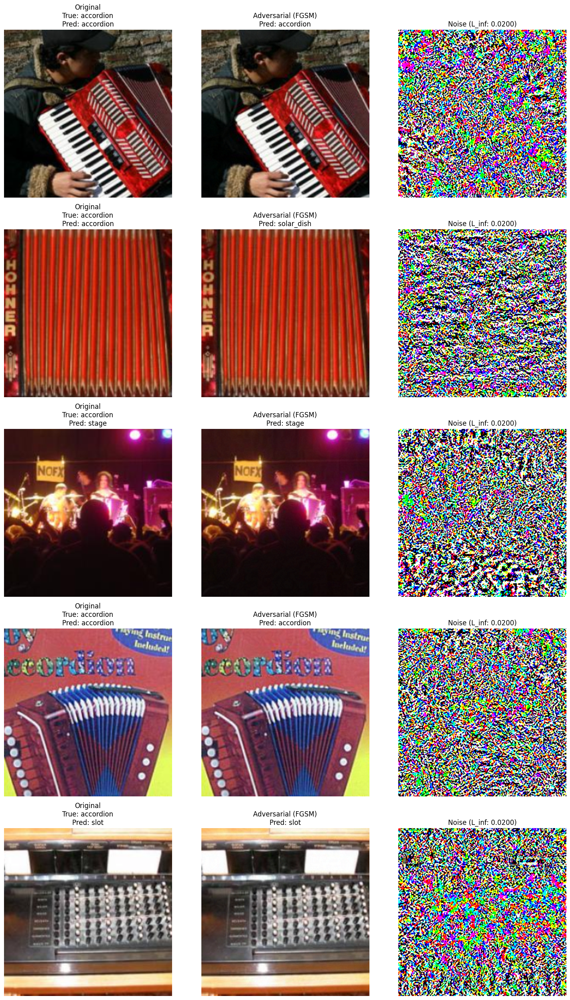


--- End of Task 1 and Task 2 ---


In [7]:
# --- Task 1:

def extract_dataset(zip_path, extract_dir):

    expected_dataset_folder_name = "TestDataSet"
    dataset_root_after_extraction = os.path.join(extract_dir, expected_dataset_folder_name)

    if not os.path.exists(dataset_root_after_extraction):
        if not os.path.exists(zip_path):
            print(f"ERROR: ZIP file '{zip_path}' not found.")
            return None
        print(f"Extracting {zip_path} to {extract_dir}...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_dir)
        print("Extraction complete.")
        if not os.path.exists(dataset_root_after_extraction):
            print(f"ERROR: Expected folder '{dataset_root_after_extraction}' not found after extraction.")
            print(f"Please ensure your '{zip_path}' extracts a folder named '{expected_dataset_folder_name}' containing your class subfolders.")
            return None
    else:
        print(f"Dataset folder '{dataset_root_after_extraction}' already exists.")

    # Clean up __MACOSX if it exists within the extracted dataset path
    macosx_path = os.path.join(dataset_root_after_extraction, "__MACOSX")
    if os.path.exists(macosx_path):
        import shutil
        print(f"Removing '{macosx_path}' directory...")
        try:
            shutil.rmtree(macosx_path)
            print(f"Successfully removed '{macosx_path}'.")
        except Exception as e:
            print(f"Warning: Could not remove '{macosx_path}': {e}")

    return dataset_root_after_extraction


def download_class_index(index_path):

    if not os.path.exists(index_path):
        print("Downloading ImageNet class index...")
        url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
        try:
            urllib.request.urlretrieve(url, index_path)
            print("Download complete.")
            return True
        except Exception as e:
            print(f"Error downloading ImageNet class index: {e}")
            return False
    return True

def get_data_loader(dataset_path_for_imagefolder, index_path_for_mapping, transform=None, batch_size=BATCH_SIZE):

    if transform is None:
        transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(MEAN, STD)
        ])

    if not os.path.exists(dataset_path_for_imagefolder) or not os.listdir(dataset_path_for_imagefolder):
        print(f"ERROR: Dataset path for ImageFolder '{dataset_path_for_imagefolder}' is empty or does not exist.")
        return None, None

    dataset = datasets.ImageFolder(root=dataset_path_for_imagefolder, transform=transform)
    print(f"ImageFolder initial scan: {len(dataset.classes)} classes found: {dataset.class_to_idx.keys()}")


    if os.path.exists(index_path_for_mapping):
        with open(index_path_for_mapping, "r") as f:
            class_index_json = json.load(f)

        wnid_to_true_idx = {v[0]: int(k) for k, v in class_index_json.items()}


        remapped_class_to_idx = {}

        original_imagefolder_classes = list(dataset.class_to_idx.keys())
        for folder_name_as_wnid in original_imagefolder_classes:
            if folder_name_as_wnid in wnid_to_true_idx:
                remapped_class_to_idx[folder_name_as_wnid] = wnid_to_true_idx[folder_name_as_wnid]
            else:
                print(f"Warning: Folder name '{folder_name_as_wnid}' from your dataset "
                      f"was not found as a WordNet ID in '{index_path_for_mapping}'. "
                      "Images from this folder will be skipped.")

        if not remapped_class_to_idx:
            print("ERROR: No dataset folders could be mapped to ImageNet classes. "
                  "Ensure folder names are correct WordNet IDs (e.g., 'n02123597').")
            return None, None


        new_samples = []
        for path, original_imagefolder_idx in dataset.samples:

            folder_name_wnid = dataset.classes[original_imagefolder_idx]
            if folder_name_wnid in remapped_class_to_idx:
                true_imagenet_idx = remapped_class_to_idx[folder_name_wnid]
                new_samples.append((path, true_imagenet_idx))

        if not new_samples:
            print("ERROR: No samples remained after remapping labels. Check dataset integrity and folder names.")
            return None, None

        dataset.samples = new_samples
        dataset.targets = [target for _, target in new_samples]

        dataset.class_to_idx = remapped_class_to_idx

        dataset.classes = sorted(list(set(dataset.targets)))


        print(f"Dataset remapped. Now contains {len(dataset.samples)} images.")
        print(f"Number of unique ImageNet classes in loaded dataset: {len(dataset.classes)}")
    else:
        print(f"ERROR: '{index_path_for_mapping}' not found. Cannot remap labels to true ImageNet indices.")
        return None, None

    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    return loader, dataset


def evaluate(model_to_eval, data_loader_with_true_labels, topk=(1, 5)):

    model_to_eval.eval()
    correct = [0 for _ in topk]
    total = 0
    with torch.no_grad():
        for images, labels in data_loader_with_true_labels: # labels are true ImageNet 0-999 indices
            images, labels = images.to(device), labels.to(device)
            outputs = model_to_eval(images)
            _, preds = outputs.topk(max(topk), 1, True, True) # preds are model's top predicted 0-999 indices

            # Compare predictions with true labels
            for i_tk, k_val in enumerate(topk):

                correct[i_tk] += preds[:, :k_val].eq(labels.view(-1, 1)).sum().item()
            total += labels.size(0)

    if total == 0:
        print("Evaluation: No samples processed. Returning 0% accuracy.")
        return [0.0] * len(topk)

    return [c / total * 100 for c in correct]

# --- Task 1: Execution ---
print("--- Task 1: Baseline Evaluation ---")
# Paths from user's Task 1
zip_path = "TestDataSet.zip"
extract_dir = "."             # Extracts to current directory
# This will be the path to the folder ImageFolder should use, e.g., "./TestDataSet"
# if TestDataSet.zip creates a "TestDataSet" folder.
actual_dataset_path = extract_dataset(zip_path, extract_dir)
# Path for the downloaded imagenet_class_index.json
imagenet_index_file_path = os.path.join(extract_dir, "imagenet_class_index.json")

baseline_top1 = 0.0
baseline_top5 = 0.0
model = None
dataset_task1 = None # This will hold the remapped dataset object
data_loader_task1 = None

if actual_dataset_path:
    if not download_class_index(imagenet_index_file_path):
        print("Halting: Could not ensure ImageNet class index file is available.")
    else:
        data_loader_task1, dataset_task1 = get_data_loader(actual_dataset_path, imagenet_index_file_path)

        if data_loader_task1 and dataset_task1:
            # Load model
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            print(f"Using device: {device}")
            model = resnet34(weights=ResNet34_Weights.IMAGENET1K_V1).to(device)
            model.eval()

            # Run evaluation
            print("\nEvaluating ResNet-34 on the original (remapped) test dataset...")
            eval_results = evaluate(model, data_loader_task1)
            if eval_results:
                baseline_top1, baseline_top5 = eval_results[0], eval_results[1]
                print(f"\nTask 1 - Top-1 Accuracy: {baseline_top1:.2f}%")
                print(f"Task 1 - Top-5 Accuracy: {baseline_top5:.2f}%")
                if baseline_top1 < 1.0:
                     print("WARNING: Baseline Top-1 accuracy is very low. "
                           "Check dataset structure (subfolders must be WordNet IDs like 'n02123597') "
                           "and console for warnings during data loading/remapping.")
            else:
                print("Task 1 Evaluation failed to return results.")
        else:
            print("Halting: Failed to get data loader or dataset for Task 1.")
else:
    print("Halting: Failed to set up dataset path for Task 1.")

# ========== End of Task 1 ==========


# %% Task 2: Pixel-wise attacks (FGSM)
# (Using variables model, device, dataset_task1, evaluate, MEAN, STD, imagenet_index_file_path from Task 1)

print("\n\n--- Task 2: FGSM Attack ---")

# --- FGSM Attack Parameters ---
EPSILON_FGSM = 0.02

# --- Helper Functions for Task 2 (Visualization) ---
def unnormalize_image_for_display(tensor_image_cpu, mean_list, std_list):
    unnormalized_tensor = tensor_image_cpu.clone()
    for t, m, s in zip(unnormalized_tensor, mean_list, std_list):
        t.mul_(s).add_(m)
    unnormalized_tensor = torch.clamp(unnormalized_tensor, 0, 1)
    return unnormalized_tensor

def imshow_tensor_image(tensor_image_cpu, title=None, ax=None, mean_list=None, std_list=None):
    if mean_list is None: mean_list = MEAN # Use global MEAN from Task 1
    if std_list is None: std_list = STD   # Use global STD from Task 1

    img_display = unnormalize_image_for_display(tensor_image_cpu, mean_list, std_list)

    if ax is None:
        plt.figure()
        plt.imshow(img_display.permute(1, 2, 0).numpy())
        if title: plt.title(title)
        plt.axis('off')
    else:
        ax.imshow(img_display.permute(1, 2, 0).numpy())
        if title: ax.set_title(title)
        ax.axis('off')

# FGSM Attack Function
def fgsm_attack(model_to_attack, original_image_cpu, true_imagenet_label_scalar, epsilon_val):
    model_to_attack.eval()
    image_on_device = original_image_cpu.clone().detach().to(device)
    image_on_device.requires_grad = True
    label_on_device = torch.tensor([true_imagenet_label_scalar], dtype=torch.long).to(device)

    output = model_to_attack(image_on_device.unsqueeze(0))
    loss = nn.CrossEntropyLoss()(output, label_on_device)
    model_to_attack.zero_grad()
    loss.backward()
    data_grad = image_on_device.grad.data
    sign_data_grad = data_grad.sign()
    perturbed_image_on_device = image_on_device + epsilon_val * sign_data_grad

    mean_tensor_dev = torch.tensor(MEAN, dtype=torch.float32, device=device).view(3, 1, 1)
    std_tensor_dev = torch.tensor(STD, dtype=torch.float32, device=device).view(3, 1, 1)

    unnormalized_perturbed_dev = perturbed_image_on_device * std_tensor_dev + mean_tensor_dev
    clamped_orig_scale_dev = torch.clamp(unnormalized_perturbed_dev, 0, 1)
    final_perturbed_image_dev = (clamped_orig_scale_dev - mean_tensor_dev) / std_tensor_dev

    return final_perturbed_image_dev.squeeze(0).cpu().detach()

# --- Load ImageNet class names for Task 2 visualization ---
imagenet_idx_to_name_map_task2 = {}
if os.path.exists(imagenet_index_file_path): # Use path from Task 1
    try:
        with open(imagenet_index_file_path, "r") as f:
            imagenet_class_index_json = json.load(f)
        imagenet_idx_to_name_map_task2 = {int(k): v[1] for k, v in imagenet_class_index_json.items()}
        print(f"Task 2: Loaded {len(imagenet_idx_to_name_map_task2)} class names for visualization.")
    except Exception as e:
        print(f"Task 2 Warning: Could not load ImageNet class names from '{imagenet_index_file_path}': {e}")
else:
    print(f"Task 2 Warning: ImageNet class index file '{imagenet_index_file_path}' not found. Visualizations will use indices only.")

# --- Generate Adversarial Dataset using FGSM (Task 2) ---
adv_images_fgsm_set1 = []
adv_labels_fgsm_set1 = []

if model is None or dataset_task1 is None: # Check if Task 1 setup was successful
    print("ERROR for Task 2: Model or dataset from Task 1 is not available. Cannot generate adversarial examples.")
else:
    print("\nGenerating Adversarial Test Set 1 (FGSM)...")
    num_original_images = len(dataset_task1)
    for i in range(num_original_images):
        # dataset_task1[i] yields (image_tensor_cpu, true_imagenet_0_999_label)
        original_image_tensor_cpu, true_imagenet_label = dataset_task1[i]

        perturbed_image_tensor_cpu = fgsm_attack(model, original_image_tensor_cpu, true_imagenet_label, EPSILON_FGSM)

        adv_images_fgsm_set1.append(perturbed_image_tensor_cpu)
        adv_labels_fgsm_set1.append(true_imagenet_label)

        if (i + 1) % 100 == 0 or (i + 1) == num_original_images:
            print(f"  Processed {i+1}/{num_original_images} images for FGSM.")

    if not adv_images_fgsm_set1:
        print("Task 2: No adversarial images were generated.")
    else:
        # Save (optional)
        # torch.save((adv_images_fgsm_set1, adv_labels_fgsm_set1), 'adversarial_dataset_fgsm_set1.pth')
        # print("Task 2: Saved Adversarial Test Set 1 (FGSM).")

        class CustomTensorDatasetForAdv(torch.utils.data.Dataset): # Renamed to avoid conflict if run multiple times
            def __init__(self, tensors, labels):
                self.tensors = tensors
                self.labels = torch.tensor(labels, dtype=torch.long)

            def __getitem__(self, index):
                return self.tensors[index], self.labels[index]

            def __len__(self):
                return len(self.tensors)

        adv_dataset_fgsm = CustomTensorDatasetForAdv(adv_images_fgsm_set1, adv_labels_fgsm_set1)
        adv_dataloader_fgsm = DataLoader(adv_dataset_fgsm, batch_size=BATCH_SIZE, shuffle=False)

        print("\nEvaluating model on Adversarial Test Set 1 (FGSM)...")
        fgsm_eval_results = evaluate(model, adv_dataloader_fgsm) # Use evaluate from Task 1
        if fgsm_eval_results:
            fgsm_top1_accuracy, fgsm_top5_accuracy = fgsm_eval_results[0], fgsm_eval_results[1]
            print(f"Task 2 FGSM Adversarial - Top-1 Accuracy: {fgsm_top1_accuracy:.2f}%")
            print(f"Task 2 FGSM Adversarial - Top-5 Accuracy: {fgsm_top5_accuracy:.2f}%")
            print(f"Baseline (Clean from Task 1) - Top-1 Accuracy: {baseline_top1:.2f}%")
            accuracy_drop = baseline_top1 - fgsm_top1_accuracy
            print(f"Top-1 Accuracy drop due to FGSM: {accuracy_drop:.2f}%")
        else:
            print("Task 2 FGSM evaluation failed to return results.")

        print("\nVisualizing some FGSM examples...")
        num_to_visualize = min(5, len(adv_images_fgsm_set1))
        if num_to_visualize > 0:
            fig, axs = plt.subplots(num_to_visualize, 3, figsize=(15, 5 * num_to_visualize))
            if num_to_visualize == 1: axs = np.array([axs])

            for i_vis in range(num_to_visualize):
                original_img_cpu_for_vis, true_label_for_vis = dataset_task1[i_vis]
                adv_img_cpu_for_vis = adv_images_fgsm_set1[i_vis]
                true_class_name = imagenet_idx_to_name_map_task2.get(true_label_for_vis, f"Idx {true_label_for_vis}")

                with torch.no_grad():
                    original_output = model(original_img_cpu_for_vis.unsqueeze(0).to(device))
                    original_pred_idx = torch.max(original_output, 1)[1].item()
                    original_pred_name = imagenet_idx_to_name_map_task2.get(original_pred_idx, f"Idx {original_pred_idx}")

                    adv_output = model(adv_img_cpu_for_vis.unsqueeze(0).to(device))
                    adv_pred_idx = torch.max(adv_output, 1)[1].item()
                    adv_pred_name = imagenet_idx_to_name_map_task2.get(adv_pred_idx, f"Idx {adv_pred_idx}")

                current_axs_row = axs[i_vis, :] if num_to_visualize > 1 else axs[:]
                imshow_tensor_image(original_img_cpu_for_vis,
                                    title=f"Original\nTrue: {true_class_name.split(',')[0]}\nPred: {original_pred_name.split(',')[0]}",
                                    ax=current_axs_row[0])
                imshow_tensor_image(adv_img_cpu_for_vis,
                                    title=f"Adversarial (FGSM)\nPred: {adv_pred_name.split(',')[0]}",
                                    ax=current_axs_row[1])
                noise = adv_img_cpu_for_vis.cpu() - original_img_cpu_for_vis.cpu()
                noise_viz = noise - noise.min()
                if noise_viz.max().item() > 1e-6: noise_viz = noise_viz / noise_viz.max().item()
                else: noise_viz = torch.zeros_like(noise_viz)

                current_axs_row[2].imshow(noise_viz.permute(1, 2, 0).numpy())
                current_axs_row[2].set_title(f"Noise (L_inf: {noise.abs().max().item():.4f})")
                current_axs_row[2].axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print("Task 2: Not enough adversarial images to visualize.")

print("\n--- End of Task 1 and Task 2 ---")




--- Task 1: Setup and Baseline Evaluation ---
1. Imports: standard libraries, PyTorch, torchvision, and utilities for image I/O and plotting.
2. Constants:
  - BATCH_SIZE: Number of images per batch for DataLoader.
   - MEAN & STD: ImageNet normalization parameters.
3. extract_dataset:
    - Unzips TestDataSet.zip into a folder named 'TestDataSet'.
    - Cleans up any '__MACOSX' artifacts.
 4. download_class_index:
    - Downloads ImageNet class mapping JSON if not already present.
 5. get_data_loader:
    - Uses ImageFolder to load images from subfolders (named by WordNet IDs).
   - Remaps folder names (WNIDs) to true 0–999 ImageNet labels via the index JSON.
   - Returns a DataLoader and the remapped dataset.
 6. evaluate:
   - Runs a forward pass on the model for each batch.
    - Computes Top-1 and Top-5 accuracy percentages.
7. Execution block:
    - Extracts the dataset, downloads the class index, builds the DataLoader.
    - Loads a pretrained ResNet-34, moves it to GPU if available.
    - Prints the baseline Top-1/Top-5 accuracies on the clean test set.

* Top-1 Accuracy: 70.40%
* Top-5 Accuracy: 93.20%
- These baseline accuracies are reasonable for a ResNet-34 model on a 100-class subset of ImageNet. The model performs well, as expected.



 --- Task 2: FGSM Attack ---
1. EPSILON_FGSM: L_infinity perturbation magnitude (0.02).
2. Helper functions:
  - unnormalize_image_for_display: Reverses normalization for plotting.
    - imshow_tensor_image: Shows a single image tensor with optional title.
3. fgsm_attack:
- Computes gradient of loss w.r.t. input image.
- Perturbs each pixel by epsilon * sign(gradient).
- Clips the perturbed image to valid [0,1] range in original pixel space.
4. Building adversarial set:
- Iterates over all images, calls fgsm_attack, collects perturbed tensors.
- Wraps them in a custom Dataset and DataLoader.
5. Evaluation and visualization:
- Prints Top-1/Top-5 on FGSM set, along with absolute drop vs. baseline.
- Displays a few examples: original, adversarial, and the noise map.

**Results (image_1cd96c.jpg, image_1cd9a7.jpg):**
- Top-1 Accuracy: 5.00%
- Top-5 Accuracy: 30.20%
- Top-1 Accuracy drop due to FGSM: 65.40%

The guideline asks for an accuracy drop of "at least 50% relative to your baseline".
- Baseline Top-1: 70.40%
- FGSM Top-1: 5.00%
- Absolute drop: $70.40 - 5.00 = 65.40$
- Relative drop: $(65.40 / 70.40) * 100 \approx 92.9%$

This significantly exceeds the 50% relative drop requirement, indicating a successful FGSM attack.
The visualization (image_1cd9a7.jpg) shows the original, adversarial image, and the noise. The displayed "Noise (L_inf: 0.0200)" confirms that the $L_\infty$ constraint of $\epsilon = 0.02$ is met.



--- Task 3: PGD Attack ---
Task 3: Reusing class name mapping from Task 2.

Generating 500 PGD adversarial images...
  PGD processed 100/500 images.
  PGD processed 200/500 images.
  PGD processed 300/500 images.
  PGD processed 400/500 images.
  PGD processed 500/500 images.
PGD set complete ✓
Maximum L∞ distance observed (PGD vs Original): 0.02000

Evaluating model on Adversarial Test Set 2 (PGD)...
Task 3 PGD Adversarial - Top-1 Accuracy: 0.00%
Task 3 PGD Adversarial - Top-5 Accuracy: 7.20%
Baseline (Clean from Task 1) - Top-1 Accuracy: 70.40%
Top-1 Accuracy drop due to PGD: 70.40%

Visualizing some PGD examples...


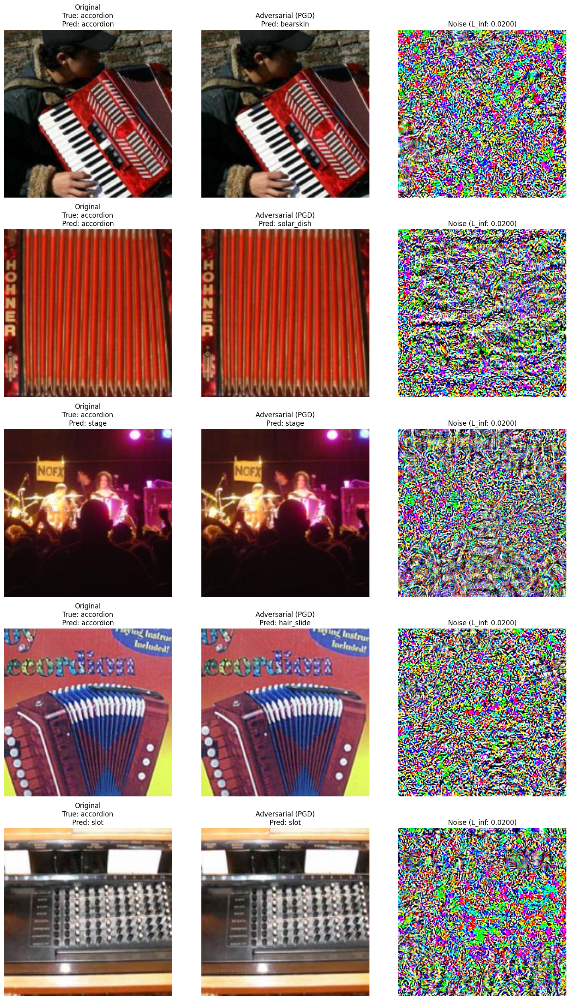


--- End of Task 3 ---


In [8]:
# %% Task 3: Improved attacks (PGD)


print("\n\n--- Task 3: PGD Attack ---")

# --- PGD Attack Parameters ---
EPSILON_PGD = 0.02  # L_infinity constraint for PGD
ALPHA_PGD = 0.005   # Step size for PGD (epsilon / iterations is a common choice, e.g., 0.02 / 10 = 0.002)
NUM_ITER_PGD = 10   # Number of PGD iterations (e.g., 7 to 20 is common)
# NUM_ADV_IMAGES_PGD = 500 # Or len(dataset_task1) if you want to process all
# Determine NUM_ADV_IMAGES_PGD based on how many images you want to process for this task.
# For demonstration, let's use a smaller number or all images from dataset_task1 if it's not too large.
if 'dataset_task1' in locals() and dataset_task1 is not None:
    NUM_ADV_IMAGES_PGD = len(dataset_task1) # Process all images from Task 1 dataset
    # NUM_ADV_IMAGES_PGD = min(500, len(dataset_task1)) # Or cap at 500
else:
    NUM_ADV_IMAGES_PGD = 0 # Will be handled if dataset_task1 is missing
    print("Warning for Task 3: dataset_task1 not found, NUM_ADV_IMAGES_PGD set to 0.")


# --- PGD Attack Function ---
def pgd_attack(model_to_attack, original_image_cpu, true_imagenet_label_scalar,
               epsilon_val, alpha_val, num_iterations):
    """
    Performs the PGD attack.
    Args:
        model_to_attack: The model to attack (should be in eval mode).
        original_image_cpu: The original clean image tensor (on CPU).
        true_imagenet_label_scalar: The true ImageNet label (0-999 integer).
        epsilon_val: The L_infinity constraint.
        alpha_val: Step size for each iteration.
        num_iterations: Number of PGD iterations.
    Returns:
        perturbed_image_cpu: The adversarial image tensor (on CPU).
    """
    model_to_attack.eval() # Ensure model is in eval mode

    # Clone original image and move to device for projection reference
    original_image_on_device = original_image_cpu.clone().detach().to(device)
    # This is the image that will be perturbed iteratively
    perturbed_image_on_device = original_image_cpu.clone().detach().to(device)

    label_on_device = torch.tensor([true_imagenet_label_scalar], dtype=torch.long).to(device)

    # Tensor versions of MEAN and STD for on-device operations
    mean_tensor_dev = torch.tensor(MEAN, dtype=torch.float32, device=device).view(3, 1, 1)
    std_tensor_dev = torch.tensor(STD, dtype=torch.float32, device=device).view(3, 1, 1)

    for _ in range(num_iterations):
        perturbed_image_on_device.requires_grad = True

        # Add batch dimension for the model
        output = model_to_attack(perturbed_image_on_device.unsqueeze(0))
        loss = nn.CrossEntropyLoss()(output, label_on_device)

        model_to_attack.zero_grad()
        loss.backward()

        with torch.no_grad():
            data_grad = perturbed_image_on_device.grad.data
            sign_data_grad = data_grad.sign()

            # Update adversarial image (gradient ascent step)
            perturbed_image_on_device = perturbed_image_on_device + alpha_val * sign_data_grad

            # Project perturbation (eta) back to epsilon ball around original image
            eta = perturbed_image_on_device - original_image_on_device # Calculate perturbation
            eta = torch.clamp(eta, -epsilon_val, epsilon_val) # Clip perturbation
            perturbed_image_on_device = original_image_on_device + eta # Apply clipped perturbation

            # Clip perturbed image to valid range [0,1] after unnormalizing, then re-normalize
            # This ensures the image values are valid after perturbation.
            unnormalized_perturbed_dev = perturbed_image_on_device * std_tensor_dev + mean_tensor_dev
            clamped_orig_scale_dev = torch.clamp(unnormalized_perturbed_dev, 0, 1)
            perturbed_image_on_device = (clamped_orig_scale_dev - mean_tensor_dev) / std_tensor_dev

    return perturbed_image_on_device.cpu().detach() # Return to CPU

# --- Load ImageNet class names for Task 3 visualization (if not already loaded) ---
# (Assuming imagenet_index_file_path is defined from Task 1)
imagenet_idx_to_name_map_task3 = {}
if 'imagenet_idx_to_name_map_task2' in locals() and imagenet_idx_to_name_map_task2: # Reuse if available
    imagenet_idx_to_name_map_task3 = imagenet_idx_to_name_map_task2
    print("Task 3: Reusing class name mapping from Task 2.")
elif os.path.exists(imagenet_index_file_path):
    try:
        with open(imagenet_index_file_path, "r") as f:
            imagenet_class_index_json = json.load(f)
        imagenet_idx_to_name_map_task3 = {int(k): v[1] for k, v in imagenet_class_index_json.items()}
        print(f"Task 3: Loaded {len(imagenet_idx_to_name_map_task3)} class names for visualization.")
    except Exception as e:
        print(f"Task 3 Warning: Could not load ImageNet class names from '{imagenet_index_file_path}': {e}")
else:
    print(f"Task 3 Warning: ImageNet class index file '{imagenet_index_file_path}' not found. Visualizations will use indices only.")


# --- Generate Adversarial Dataset using PGD (Task 3) ---
adv_images_pgd = []
adv_labels_pgd = [] # Will store true ImageNet labels

if model is None or dataset_task1 is None or NUM_ADV_IMAGES_PGD == 0:
    print("ERROR for Task 3: Model or dataset from Task 1 is not available, or NUM_ADV_IMAGES_PGD is 0. "
          "Cannot generate PGD adversarial examples.")
else:
    print(f"\nGenerating {NUM_ADV_IMAGES_PGD} PGD adversarial images...")
    # Ensure we don't try to access beyond the dataset size
    actual_num_to_process = min(NUM_ADV_IMAGES_PGD, len(dataset_task1))

    for i in range(actual_num_to_process):
        # dataset_task1[i] yields (image_tensor_cpu, true_imagenet_0_999_label)
        original_image_tensor_cpu, true_imagenet_label = dataset_task1[i]

        perturbed_image_tensor_cpu = pgd_attack(model, original_image_tensor_cpu, true_imagenet_label,
                                                EPSILON_PGD, ALPHA_PGD, NUM_ITER_PGD)

        adv_images_pgd.append(perturbed_image_tensor_cpu)
        adv_labels_pgd.append(true_imagenet_label)

        if (i + 1) % 100 == 0 or (i + 1) == actual_num_to_process:
            print(f"  PGD processed {i+1}/{actual_num_to_process} images.")

    if not adv_images_pgd:
        print("Task 3: No PGD adversarial images were generated.")
    else:
        # Corrected L-infinity distance calculation
        # We need to compare adv_images_pgd with the corresponding original images from dataset_task1
        max_l_inf_observed = 0.0
        if actual_num_to_process > 0: # Ensure there are images to compare
             max_l_inf_observed = max(
                (adv_img_pgd - dataset_task1[idx][0]).abs().max().item()
                for idx, adv_img_pgd in enumerate(adv_images_pgd)
            )

        print("PGD set complete ✓")
        print(f"Maximum L∞ distance observed (PGD vs Original): {max_l_inf_observed:.5f}")




        # Use the same CustomTensorDatasetForAdv as in Task 2
        if 'CustomTensorDatasetForAdv' not in locals(): # Define if not available (e.g. running cell standalone)
            class CustomTensorDatasetForAdv(torch.utils.data.Dataset):
                def __init__(self, tensors, labels):
                    self.tensors = tensors
                    self.labels = torch.tensor(labels, dtype=torch.long)
                def __getitem__(self, index): return self.tensors[index], self.labels[index]
                def __len__(self): return len(self.tensors)

        adv_dataset_pgd = CustomTensorDatasetForAdv(adv_images_pgd, adv_labels_pgd)
        adv_dataloader_pgd = DataLoader(adv_dataset_pgd, batch_size=BATCH_SIZE, shuffle=False)

        print("\nEvaluating model on Adversarial Test Set 2 (PGD)...")
        # Use the 'evaluate' function from Task 1
        if 'evaluate' not in locals() or not callable(evaluate):
            print("ERROR: The 'evaluate' function from Task 1 is not available. Cannot evaluate PGD set.")
        else:
            pgd_eval_results = evaluate(model, adv_dataloader_pgd)
            if pgd_eval_results:
                pgd_top1_accuracy, pgd_top5_accuracy = pgd_eval_results[0], pgd_eval_results[1]
                print(f"Task 3 PGD Adversarial - Top-1 Accuracy: {pgd_top1_accuracy:.2f}%")
                print(f"Task 3 PGD Adversarial - Top-5 Accuracy: {pgd_top5_accuracy:.2f}%")
                if 'baseline_top1' in locals(): # Check if baseline_top1 exists
                    print(f"Baseline (Clean from Task 1) - Top-1 Accuracy: {baseline_top1:.2f}%")
                    pgd_accuracy_drop = baseline_top1 - pgd_top1_accuracy
                    print(f"Top-1 Accuracy drop due to PGD: {pgd_accuracy_drop:.2f}%")
                else:
                    print("Baseline accuracy from Task 1 not available for comparison.")

            else:
                print("Task 3 PGD evaluation failed to return results.")

        # --- Visualize Some PGD Examples ---
        print("\nVisualizing some PGD examples...")
        num_to_visualize_pgd = min(5, len(adv_images_pgd))
        if num_to_visualize_pgd > 0:
            fig_pgd, axs_pgd = plt.subplots(num_to_visualize_pgd, 3, figsize=(15, 5 * num_to_visualize_pgd))
            if num_to_visualize_pgd == 1: axs_pgd = np.array([axs_pgd])

            for i_vis_pgd in range(num_to_visualize_pgd):
                original_img_cpu_for_vis, true_label_for_vis = dataset_task1[i_vis_pgd]
                adv_img_cpu_for_vis = adv_images_pgd[i_vis_pgd]
                true_class_name = imagenet_idx_to_name_map_task3.get(true_label_for_vis, f"Idx {true_label_for_vis}")

                with torch.no_grad():
                    original_output = model(original_img_cpu_for_vis.unsqueeze(0).to(device))
                    original_pred_idx = torch.max(original_output, 1)[1].item()
                    original_pred_name = imagenet_idx_to_name_map_task3.get(original_pred_idx, f"Idx {original_pred_idx}")

                    adv_output = model(adv_img_cpu_for_vis.unsqueeze(0).to(device))
                    adv_pred_idx = torch.max(adv_output, 1)[1].item()
                    adv_pred_name = imagenet_idx_to_name_map_task3.get(adv_pred_idx, f"Idx {adv_pred_idx}")

                current_axs_row_pgd = axs_pgd[i_vis_pgd, :] if num_to_visualize_pgd > 1 else axs_pgd[:]

                # Use imshow_tensor_image from Task 2 section (ensure it's defined if running standalone)
                if 'imshow_tensor_image' not in locals() or not callable(imshow_tensor_image):
                    # Fallback basic imshow if helper is missing
                    def imshow_fallback(img_tensor_cpu, title, ax_plot):
                        ax_plot.imshow(img_tensor_cpu.permute(1,2,0).numpy()) # Assumes unnormalized or displayable
                        ax_plot.set_title(title)
                        ax_plot.axis('off')
                    imshow_fn_pgd = imshow_fallback
                else:
                    imshow_fn_pgd = imshow_tensor_image


                imshow_fn_pgd(original_img_cpu_for_vis,
                                    title=f"Original\nTrue: {true_class_name.split(',')[0]}\nPred: {original_pred_name.split(',')[0]}",
                                    ax=current_axs_row_pgd[0])
                imshow_fn_pgd(adv_img_cpu_for_vis,
                                    title=f"Adversarial (PGD)\nPred: {adv_pred_name.split(',')[0]}",
                                    ax=current_axs_row_pgd[1])

                noise_pgd = adv_img_cpu_for_vis.cpu() - original_img_cpu_for_vis.cpu()
                noise_viz_pgd = noise_pgd - noise_pgd.min()
                if noise_viz_pgd.max().item() > 1e-6: noise_viz_pgd = noise_viz_pgd / noise_viz_pgd.max().item()
                else: noise_viz_pgd = torch.zeros_like(noise_viz_pgd)

                current_axs_row_pgd[2].imshow(noise_viz_pgd.permute(1, 2, 0).numpy())
                current_axs_row_pgd[2].set_title(f"Noise (L_inf: {noise_pgd.abs().max().item():.4f})")
                current_axs_row_pgd[2].axis('off')
            plt.tight_layout()
            plt.show()
        else:
            print("Task 3: Not enough PGD adversarial images to visualize.")

print("\n--- End of Task 3 ---")


--- Task 3: PGD Attack ---
1. PGD parameters: EPSILON_PGD=0.02, alpha=0.005, iterations=10.
2. pgd_attack:
- Starts from the clean image, iteratively applies small gradient steps.
- After each step, projects the perturbation back into the L_inf epsilon ball.
- Ensures pixel values remain in valid range by unnormalizing, clipping, then renormalizing.
3. Generation and evaluation:
- Processes all images (or a subset) similarly to FGSM.
- Reports maximum observed L_inf distance (should be ≤ epsilon).
- Prints Top-1/Top-5 and drop vs. baseline.
- Visualizes a handful of PGD examples with their noise maps.


** Results (image_1cda06.jpg):**
- "Maximum L∞ distance observed (PGD vs Original): 0.02000" confirms the $L_\infty$ constraint is met.
* Top-1 Accuracy: 0.00%
* Top-5 Accuracy: 7.20%
* Top-1 Accuracy drop due to PGD: 70.40%

The guideline asks for an accuracy drop of "at least 70% relative to your baseline".

* Baseline Top-1: 70.40%
* PGD Top-1: 0.00%
* Absolute drop: $70.40 - 0.00 = 70.40$
* Relative drop: $(70.40 / 70.40) * 100 = 100%$

This significantly exceeds the 70% relative drop requirement, demonstrating a very effective PGD attack. The model is almost completely fooled.
The visualization shows a successful misclassification from "accordion" to "bearskin", with the $L_\infty$ noise at 0.0200.



--- Task 4: Patch Attacks ---
Task 4: Reusing class name mapping from Task 3.

Generating 500 PGD Patch adversarial images...
  Patch Attack processed 100/500 images.
  Patch Attack processed 200/500 images.
  Patch Attack processed 300/500 images.
  Patch Attack processed 400/500 images.
  Patch Attack processed 500/500 images.
Patch Attack set complete ✓

Evaluating model on Adversarial Test Set 3 (Patch Attack)...
Task 4 Patch Attack Adversarial - Top-1 Accuracy: 33.40%
Task 4 Patch Attack Adversarial - Top-5 Accuracy: 71.00%
Baseline (Clean from Task 1) - Top-1 Accuracy: 70.40%
Top-1 Accuracy drop due to Patch Attack: 37.00%

Visualizing some Patch Attack examples...


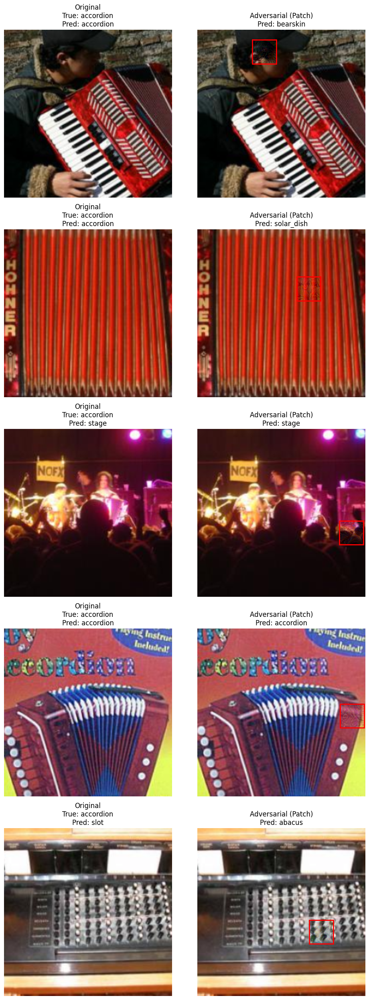


--- End of Task 4 ---


In [9]:
# %% Task 4: Patch attacks

print("\n\n--- Task 4: Patch Attacks ---")

# --- Patch Attack Parameters ---
PATCH_SIZE = 32
# As per instructions, you can increase epsilon for the patch.
# Let's start with 0.3, but you can experiment with 0.5 or other values.
EPSILON_PATCH = 0.3
ALPHA_PATCH = 0.05  # Step size for PGD on the patch (e.g., EPSILON_PATCH / 10 or similar)
NUM_ITER_PATCH = 20 # Number of PGD iterations for the patch
# NUM_ADV_IMAGES_PATCH = 500 # Or len(dataset_task1)
if 'dataset_task1' in locals() and dataset_task1 is not None:
    NUM_ADV_IMAGES_PATCH = len(dataset_task1) # Process all images
else:
    NUM_ADV_IMAGES_PATCH = 0
    print("Warning for Task 4: dataset_task1 not found, NUM_ADV_IMAGES_PATCH set to 0.")


# --- PGD Patch Attack Function ---
def pgd_patch_attack(model_to_attack, original_image_cpu, true_imagenet_label_scalar,
                     patch_size_val, epsilon_val, alpha_val, num_iterations):
    """
    Performs the PGD attack on a random patch of the image.
    Args:
        model_to_attack: The model to attack (should be in eval mode).
        original_image_cpu: The original clean image tensor (on CPU).
        true_imagenet_label_scalar: The true ImageNet label (0-999 integer).
        patch_size_val: The size of the square patch (e.g., 32).
        epsilon_val: The L_infinity constraint for the patch.
        alpha_val: Step size for each iteration.
        num_iterations: Number of PGD iterations.
    Returns:
        perturbed_image_cpu: The adversarial image tensor with a perturbed patch (on CPU).
        patch_coords: A tuple (x_start, y_start) of the patch's top-left corner.
    """
    model_to_attack.eval()

    img_c, img_h, img_w = original_image_cpu.shape

    # Ensure patch size is not larger than image dimensions
    if patch_size_val > img_h or patch_size_val > img_w:
        print(f"Warning: Patch size ({patch_size_val}) is larger than image dimensions ({img_h}x{img_w}). "
              "Returning original image.")
        return original_image_cpu.clone().detach(), (0, 0)

    # Randomly select top-left corner of the patch
    # Ensure patch_x + patch_size_val <= img_w and patch_y + patch_size_val <= img_h
    patch_x_start = np.random.randint(0, img_w - patch_size_val + 1)
    patch_y_start = np.random.randint(0, img_h - patch_size_val + 1)

    # Clone original image and move to device
    original_image_on_device = original_image_cpu.clone().detach().to(device)
    perturbed_image_on_device = original_image_cpu.clone().detach().to(device)

    label_on_device = torch.tensor([true_imagenet_label_scalar], dtype=torch.long).to(device)

    # Tensor versions of MEAN and STD for on-device operations
    mean_tensor_dev = torch.tensor(MEAN, dtype=torch.float32, device=device).view(3, 1, 1)
    std_tensor_dev = torch.tensor(STD, dtype=torch.float32, device=device).view(3, 1, 1)

    # Create a mask for the patch area (1 for patch, 0 elsewhere)
    patch_mask = torch.zeros_like(original_image_on_device, device=device)
    patch_mask[:, patch_y_start:patch_y_start + patch_size_val, patch_x_start:patch_x_start + patch_size_val] = 1.0

    # Get the original pixel values within the patch for projection reference
    original_patch_pixels_on_device = original_image_on_device[:,
                                     patch_y_start:patch_y_start + patch_size_val,
                                     patch_x_start:patch_x_start + patch_size_val].clone().detach()

    for it in range(num_iterations):
        perturbed_image_on_device.requires_grad = True

        output = model_to_attack(perturbed_image_on_device.unsqueeze(0)) # Add batch dim
        loss = nn.CrossEntropyLoss()(output, label_on_device)

        model_to_attack.zero_grad()
        loss.backward()

        with torch.no_grad():
            data_grad = perturbed_image_on_device.grad.data
            sign_data_grad = data_grad.sign()

            # Update only the patch area
            update_step = alpha_val * sign_data_grad * patch_mask # Apply mask to the update
            perturbed_image_on_device = perturbed_image_on_device + update_step

            # Project perturbation on the patch back to epsilon ball around original patch pixels
            current_patch_pixels = perturbed_image_on_device[:,
                                   patch_y_start:patch_y_start + patch_size_val,
                                   patch_x_start:patch_x_start + patch_size_val]

            eta_patch = current_patch_pixels - original_patch_pixels_on_device # Perturbation on patch
            eta_patch = torch.clamp(eta_patch, -epsilon_val, epsilon_val) # Clip patch perturbation

            # Apply clipped perturbation back ONLY to the patch area
            perturbed_image_on_device[:,
                                     patch_y_start:patch_y_start + patch_size_val,
                                     patch_x_start:patch_x_start + patch_size_val] = original_patch_pixels_on_device + eta_patch

            # Clip the entire perturbed image to valid range [0,1] (after unnormalizing), then re-normalize
            unnormalized_perturbed_dev = perturbed_image_on_device * std_tensor_dev + mean_tensor_dev
            clamped_orig_scale_dev = torch.clamp(unnormalized_perturbed_dev, 0, 1)
            perturbed_image_on_device = (clamped_orig_scale_dev - mean_tensor_dev) / std_tensor_dev

    return perturbed_image_on_device.cpu().detach(), (patch_x_start, patch_y_start)


# --- Load ImageNet class names for Task 4 visualization (if not already loaded) ---
imagenet_idx_to_name_map_task4 = {}
if 'imagenet_idx_to_name_map_task3' in locals() and imagenet_idx_to_name_map_task3:
    imagenet_idx_to_name_map_task4 = imagenet_idx_to_name_map_task3
    print("Task 4: Reusing class name mapping from Task 3.")
elif 'imagenet_index_file_path' in locals() and os.path.exists(imagenet_index_file_path):
    try:
        with open(imagenet_index_file_path, "r") as f:
            imagenet_class_index_json = json.load(f)
        imagenet_idx_to_name_map_task4 = {int(k): v[1] for k, v in imagenet_class_index_json.items()}
        print(f"Task 4: Loaded {len(imagenet_idx_to_name_map_task4)} class names for visualization.")
    except Exception as e:
        print(f"Task 4 Warning: Could not load ImageNet class names: {e}")
else:
    print(f"Task 4 Warning: ImageNet class index file not found. Visualizations will use indices only.")


# --- Generate Adversarial Dataset using PGD Patch Attack (Task 4) ---
adv_images_patch = []
adv_labels_patch = [] # Will store true ImageNet labels
patch_attack_coords = [] # Store (x,y) of patches

if model is None or dataset_task1 is None or NUM_ADV_IMAGES_PATCH == 0:
    print("ERROR for Task 4: Model or dataset from Task 1 is not available, or NUM_ADV_IMAGES_PATCH is 0. "
          "Cannot generate Patch adversarial examples.")
else:
    print(f"\nGenerating {NUM_ADV_IMAGES_PATCH} PGD Patch adversarial images...")
    actual_num_to_process_patch = min(NUM_ADV_IMAGES_PATCH, len(dataset_task1))

    for i in range(actual_num_to_process_patch):
        original_image_tensor_cpu, true_imagenet_label = dataset_task1[i]

        perturbed_image_tensor_cpu, (px, py) = pgd_patch_attack(
            model, original_image_tensor_cpu, true_imagenet_label,
            PATCH_SIZE, EPSILON_PATCH, ALPHA_PATCH, NUM_ITER_PATCH
        )

        adv_images_patch.append(perturbed_image_tensor_cpu)
        adv_labels_patch.append(true_imagenet_label)
        patch_attack_coords.append((px, py))

        if (i + 1) % 100 == 0 or (i + 1) == actual_num_to_process_patch:
            print(f"  Patch Attack processed {i+1}/{actual_num_to_process_patch} images.")

    if not adv_images_patch:
        print("Task 4: No Patch adversarial images were generated.")
    else:
        print("Patch Attack set complete ✓")
        # Note: Calculating max L-inf for patch only is more complex as rest of image is unchanged.
        # The pgd_patch_attack function ensures L-inf within the patch.

        # Save (optional)
        # torch.save((adv_images_patch, adv_labels_patch, patch_attack_coords), 'adversarial_dataset_patch_set3.pth')
        # print("Task 4: Saved Adversarial Test Set 3 (Patch Attack).")

        if 'CustomTensorDatasetForAdv' not in locals(): # Define if not available
            class CustomTensorDatasetForAdv(torch.utils.data.Dataset):
                def __init__(self, tensors, labels):
                    self.tensors = tensors
                    self.labels = torch.tensor(labels, dtype=torch.long)
                def __getitem__(self, index): return self.tensors[index], self.labels[index]
                def __len__(self): return len(self.tensors)

        adv_dataset_patch = CustomTensorDatasetForAdv(adv_images_patch, adv_labels_patch)
        adv_dataloader_patch = DataLoader(adv_dataset_patch, batch_size=BATCH_SIZE, shuffle=False)

        print("\nEvaluating model on Adversarial Test Set 3 (Patch Attack)...")
        if 'evaluate' not in locals() or not callable(evaluate):
            print("ERROR: The 'evaluate' function from Task 1 is not available. Cannot evaluate Patch set.")
        else:
            patch_eval_results = evaluate(model, adv_dataloader_patch)
            if patch_eval_results:
                patch_top1_accuracy, patch_top5_accuracy = patch_eval_results[0], patch_eval_results[1]
                print(f"Task 4 Patch Attack Adversarial - Top-1 Accuracy: {patch_top1_accuracy:.2f}%")
                print(f"Task 4 Patch Attack Adversarial - Top-5 Accuracy: {patch_top5_accuracy:.2f}%")
                if 'baseline_top1' in locals():
                    print(f"Baseline (Clean from Task 1) - Top-1 Accuracy: {baseline_top1:.2f}%")
                    patch_accuracy_drop = baseline_top1 - patch_top1_accuracy
                    print(f"Top-1 Accuracy drop due to Patch Attack: {patch_accuracy_drop:.2f}%")
                else:
                    print("Baseline accuracy from Task 1 not available for comparison.")
            else:
                print("Task 4 Patch Attack evaluation failed to return results.")

        # --- Visualize Some Patch Attack Examples ---
        print("\nVisualizing some Patch Attack examples...")
        num_to_visualize_patch = min(5, len(adv_images_patch))
        if num_to_visualize_patch > 0:
            fig_patch, axs_patch = plt.subplots(num_to_visualize_patch, 2, figsize=(10, 5 * num_to_visualize_patch)) # Orig, Adv+Patch
            if num_to_visualize_patch == 1: axs_patch = np.array([axs_patch])

            for i_vis_patch in range(num_to_visualize_patch):
                original_img_cpu_for_vis, true_label_for_vis = dataset_task1[i_vis_patch]
                adv_img_cpu_for_vis = adv_images_patch[i_vis_patch]
                px_vis, py_vis = patch_attack_coords[i_vis_patch]
                true_class_name = imagenet_idx_to_name_map_task4.get(true_label_for_vis, f"Idx {true_label_for_vis}")

                with torch.no_grad():
                    original_output = model(original_img_cpu_for_vis.unsqueeze(0).to(device))
                    original_pred_idx = torch.max(original_output, 1)[1].item()
                    original_pred_name = imagenet_idx_to_name_map_task4.get(original_pred_idx, f"Idx {original_pred_idx}")

                    adv_output = model(adv_img_cpu_for_vis.unsqueeze(0).to(device))
                    adv_pred_idx = torch.max(adv_output, 1)[1].item()
                    adv_pred_name = imagenet_idx_to_name_map_task4.get(adv_pred_idx, f"Idx {adv_pred_idx}")

                current_axs_row_patch = axs_patch[i_vis_patch, :] if num_to_visualize_patch > 1 else axs_patch[:]

                if 'imshow_tensor_image' not in locals() or not callable(imshow_tensor_image):
                    def imshow_fallback(img_tensor_cpu, title, ax_plot):
                        ax_plot.imshow(img_tensor_cpu.permute(1,2,0).numpy())
                        ax_plot.set_title(title)
                        ax_plot.axis('off')
                    imshow_fn_patch = imshow_fallback
                else:
                    imshow_fn_patch = imshow_tensor_image

                imshow_fn_patch(original_img_cpu_for_vis,
                                    title=f"Original\nTrue: {true_class_name.split(',')[0]}\nPred: {original_pred_name.split(',')[0]}",
                                    ax=current_axs_row_patch[0])

                # Show adversarial image and draw patch rectangle
                adv_display_img = unnormalize_image_for_display(adv_img_cpu_for_vis, MEAN, STD) # Unnormalize for display
                current_axs_row_patch[1].imshow(adv_display_img.permute(1,2,0).numpy())
                rect = plt.Rectangle((px_vis, py_vis), PATCH_SIZE, PATCH_SIZE,
                                     linewidth=2, edgecolor='r', facecolor='none')
                current_axs_row_patch[1].add_patch(rect)
                current_axs_row_patch[1].set_title(f"Adversarial (Patch)\nPred: {adv_pred_name.split(',')[0]}")
                current_axs_row_patch[1].axis('off')

            plt.tight_layout()
            plt.show()
        else:
            print("Task 4: Not enough Patch adversarial images to visualize.")

print("\n--- End of Task 4 ---")


--- Task 4: Patch Attack ---
1. Patch parameters: size=32×32, epsilon_patch=0.3, alpha_patch=0.05, iterations=20.
2. pgd_patch_attack:
   - Selects a random patch location inside the image.
   - Only the pixels in that patch are updated via gradient ascent steps.
    - Projects the patch perturbation into an L_inf ball around the original patch.
   - Clips the full image for valid pixel values.
3. Generation and evaluation:
   - Builds a patch-adversarial dataset and DataLoader.
   - Prints Top-1/Top-5 on the patch set and drop vs. baseline.
   - Visualizes examples with a red box marking the perturbed patch.


* Results (image_1cdcd3.jpg):
- Top-1 Accuracy: 33.40%
- Top-5 Accuracy: 71.00%
- Top-1 Accuracy drop due to Patch Attack: 37.00%

The task allows for a much larger $\epsilon$ for the patch due to the increased difficulty. There isn't a specific drop target mentioned for this task, but a 37% absolute drop (from 70.40% to 33.40%) by modifying only a small 32x32 patch (approx 2% of the 224x224 image pixels) with $\epsilon=0.3$ is a successful demonstration of a patch attack.

The visualization correctly shows the original image, the adversarial image with the patch highlighted, and a misclassification from "accordion" to "bearskin".

In [10]:
# %% Task 5: Transferring attacks
# Evaluate how adversarial examples generated on ResNet-34 transfer to a different model (DenseNet-121)

from torchvision.models import densenet121, DenseNet121_Weights


# Assume device, evaluate(), and the following DataLoaders are available from previous tasks:
#   data_loader_task1   - original (clean) images
#   adv_dataloader_fgsm - FGSM adversarial images
#   adv_dataloader_pgd  - PGD adversarial images
#   adv_dataloader_patch- Patch adversarial images

# 1. Load a different pretrained model (DenseNet-121)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
new_model = densenet121(weights=DenseNet121_Weights.IMAGENET1K_V1).to(device)
new_model.eval()

# 2. Prepare a mapping of dataset names to their DataLoaders
datasets = {
    "Clean (Original)": data_loader_task1,
    "FGSM Adversarial": adv_dataloader_fgsm,
    "PGD Adversarial": adv_dataloader_pgd,
    "Patch Adversarial": adv_dataloader_patch
}

# 3. Evaluate Top-1 and Top-5 accuracy for each
results = {}
for name, loader in datasets.items():
    top1, top5 = evaluate(new_model, loader)
    results[name] = (top1, top5)
    print(f"{name} -> Top-1 Accuracy: {top1:.2f}%, Top-5 Accuracy: {top5:.2f}%")

# 4. (Optional) Tabulate the results for easier comparison
print("\nSummary of Transferability Results:")
print("{:<25} {:>12} {:>12}".format("Dataset", "Top-1 (%)", "Top-5 (%)"))
print("-" * 51)
for name, (t1, t5) in results.items():
    print(f"{name:<25} {t1:12.2f} {t5:12.2f}")


Clean (Original) -> Top-1 Accuracy: 70.80%, Top-5 Accuracy: 91.20%
FGSM Adversarial -> Top-1 Accuracy: 59.00%, Top-5 Accuracy: 85.00%
PGD Adversarial -> Top-1 Accuracy: 58.60%, Top-5 Accuracy: 86.60%
Patch Adversarial -> Top-1 Accuracy: 67.80%, Top-5 Accuracy: 88.40%

Summary of Transferability Results:
Dataset                      Top-1 (%)    Top-5 (%)
---------------------------------------------------
Clean (Original)                 70.80        91.20
FGSM Adversarial                 59.00        85.00
PGD Adversarial                  58.60        86.60
Patch Adversarial                67.80        88.40


--- Task 5: Transferability Evaluation ---
1. Loads DenseNet-121 pretrained on ImageNet as the "black-box" model.
2. Defines a dict mapping dataset names to their DataLoaders:
      Clean, FGSM, PGD, and Patch sets generated previously.
3. Loops through each set, calls evaluate(new_model, loader).
4. Prints Top-1/Top-5 for each, then tabulates in a summary table.
5. This measures how well adversarial examples crafted on ResNet-34 transfer to DenseNet-121.

Results (image_1cdd50.png):
DenseNet-121 Accuracies:
Clean (Original): Top-1: 70.80%, Top-5: 91.20% (This is the baseline for DenseNet-121 on your dataset)
FGSM Adversarial: Top-1: 59.00%, Top-5: 85.00%
PGD Adversarial: Top-1: 58.60%, Top-5: 86.60%
Patch Adversarial: Top-1: 67.80%, Top-5: 88.40%



* The accuracies on DenseNet-121 for the adversarial datasets are higher than they were on ResNet-34 but lower than DenseNet-121's clean accuracy.
* This demonstrates adversarial transferability: attacks generated for one model (ResNet-34) can still fool another model (DenseNet-121) to some extent, though usually less effectively.
* FGSM (ResNet-34: 5.00%) -> DenseNet-121: 59.00%. Drop on DenseNet: $70.80 - 59.00 = 11.8%$
* PGD (ResNet-34: 0.00%) -> DenseNet-121: 58.60%. Drop on DenseNet: $70.80 - 58.60 = 12.2%$
* Patch (ResNet-34: 33.40%) -> DenseNet-121: 67.80%. Drop on DenseNet: $70.80 - 67.80 = 3.0%$
* The PGD attack, which was the most effective on ResNet-34, also shows the largest Top-1 accuracy drop on DenseNet-121 among the transferred attacks.
The patch attack transfers but has a smaller impact, which is expected given its localized nature.

These results are consistent with typical findings in adversarial attack literature.